## Camera Calibration

Code blocks borrowed from the Camera Calibration Github repository: https://github.com/udacity/CarND-Camera-Calibration

#### Extract object and image points

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib qt

nx = 9 # the number of inside corners in x
ny = 6 # the number of inside corners in y

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((ny*nx,3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        #write_name = 'corners_found'+str(idx)+'.jpg'
        #cv2.imwrite(write_name, img)
        cv2.imshow('img', img)
        cv2.waitKey(500)

cv2.destroyAllWindows()

#### Calculate calibration matrix and distortion coefficients

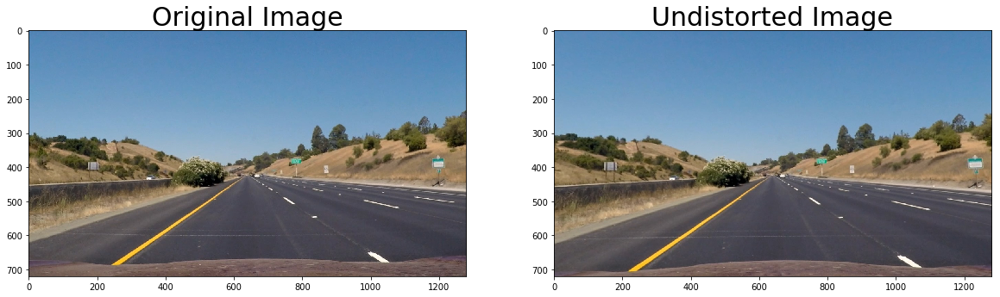

In [2]:
import pickle
%matplotlib inline

# Test undistortion on an image of a straight road
img = mpimg.imread('test_images/straight_lines1.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
undist_straight = cv2.undistort(img, mtx, dist, None, mtx)

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "./dist_pickle.p", "wb" ) )

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undist_straight)
ax2.set_title('Undistorted Image', fontsize=30)

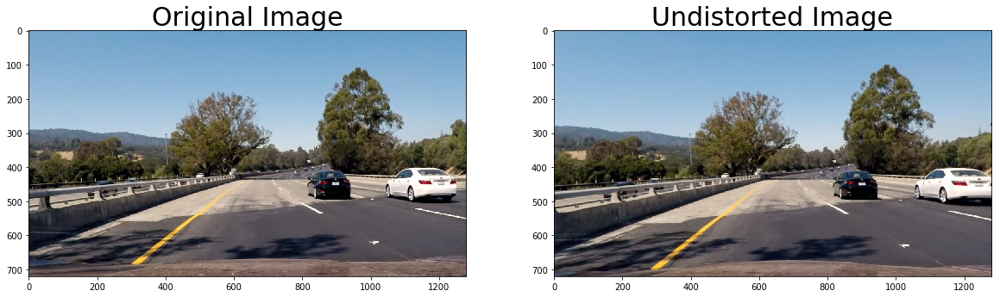

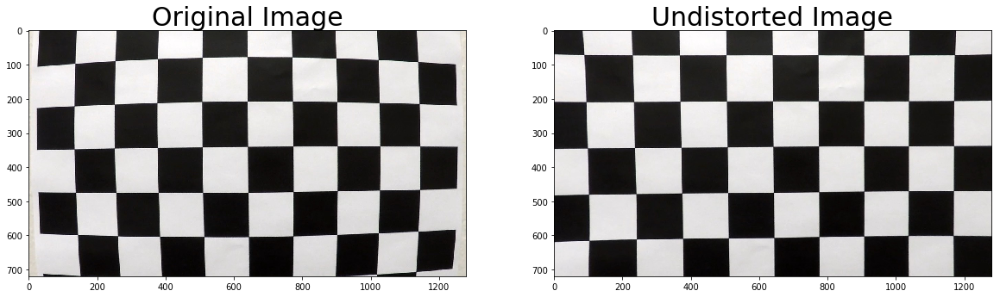

In [3]:
# Test undistortion on an image of a curved road
img = mpimg.imread('test_images/test4.jpg')
undist_curved = cv2.undistort(img, mtx, dist, None, mtx)

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undist_curved)
ax2.set_title('Undistorted Image', fontsize=30)

# Test undistortion on an image of a chessboard
img = mpimg.imread('camera_cal/calibration1.jpg')
undist_chess = cv2.undistort(img, mtx, dist, None, mtx)

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undist_chess)
ax2.set_title('Undistorted Image', fontsize=30)

## Color and Gradient Transforms

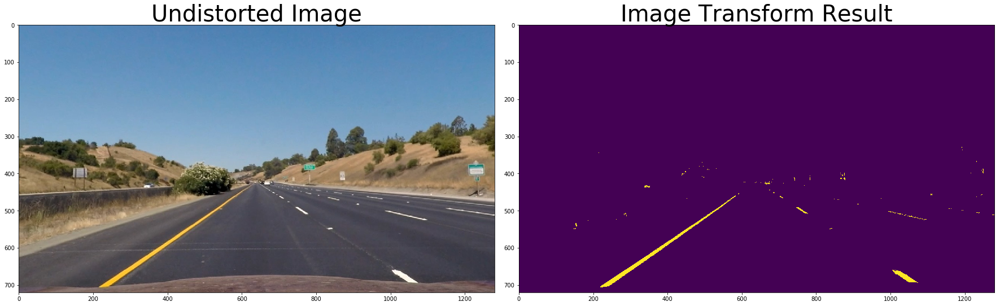

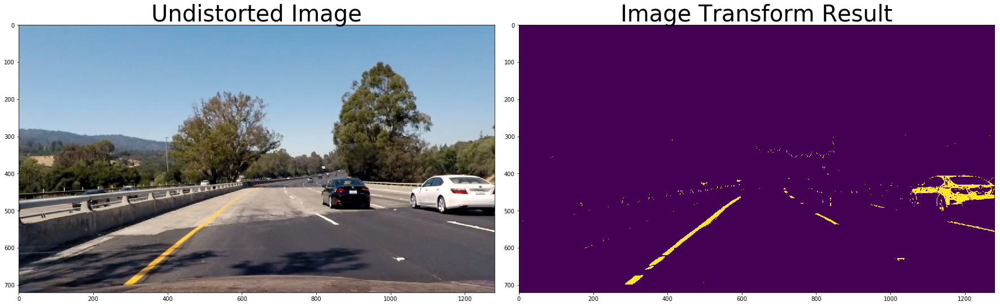

In [4]:
# Image transform pipeline
def image_transform(img, s_thresh, r_thresh, sx_thresh, mag_thresh):
    img = np.copy(img)
    r_channel = img[:,:,0]
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Convert to HLS color space and separate the L and S channels
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    s_channel = hls[:,:,2]
    
    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    # Threshold x gradient
    sx_binary = np.zeros_like(scaled_sobel)
    sx_binary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Gradient magnitude
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1) # Take the derivative in y
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    scaled_gradmag = (255*gradmag/np.max(gradmag))#.astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    grad_binary = np.zeros_like(scaled_gradmag)
    grad_binary[(scaled_gradmag >= mag_thresh[0]) & (scaled_gradmag <= mag_thresh[1])] = 1
    
    # Threshold color channels
    r_binary = np.zeros_like(r_channel)
    r_binary[(r_channel >= r_thresh[0]) & (r_channel <= r_thresh[1])] = 1
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
  
    # Combine all binary thresholds
    combined_binary = np.zeros_like(sx_binary)
    #combined_binary[((s_binary == 1) & (sx_binary == 1)) | (grad_binary == 1)] = 1
    #combined_binary[(s_binary == 1) | (sx_binary == 1)] = 1
    #combined_binary[(s_binary == 1) | (sx_binary == 1) | (grad_binary == 1)] = 1
    #combined_binary[(r_binary == 1)] = 1
    combined_binary[((s_binary == 1) | (sx_binary == 1)) & (r_binary == 1)] = 1
    
    return combined_binary
    
result_straight = image_transform(undist_straight, s_thresh=(140, 255), r_thresh=(200, 255), sx_thresh=(20, 150), mag_thresh=(30, 150))
result_curved = image_transform(undist_curved, s_thresh=(140, 255), r_thresh=(200, 255), sx_thresh=(20, 150), mag_thresh=(30, 150))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(undist_straight)
ax1.set_title('Undistorted Image', fontsize=40)
ax2.imshow(result_straight)
ax2.set_title('Image Transform Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(undist_curved)
ax1.set_title('Undistorted Image', fontsize=40)
ax2.imshow(result_curved)
ax2.set_title('Image Transform Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

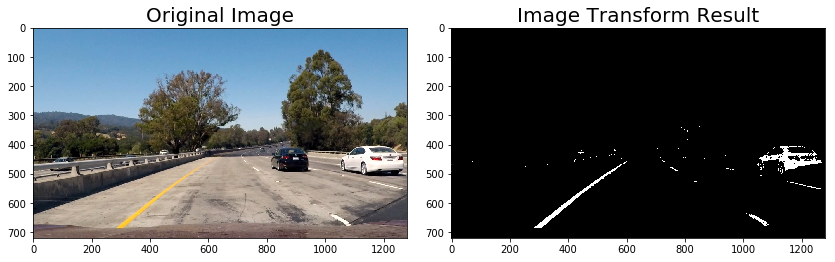

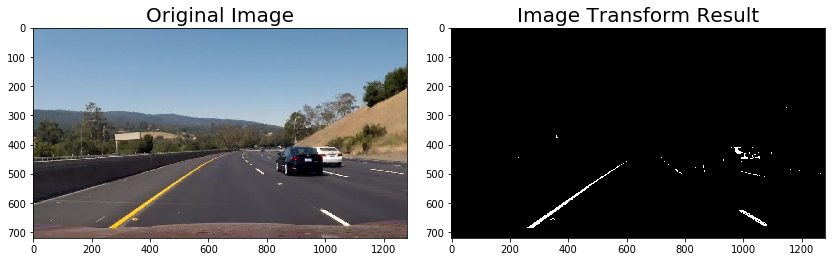

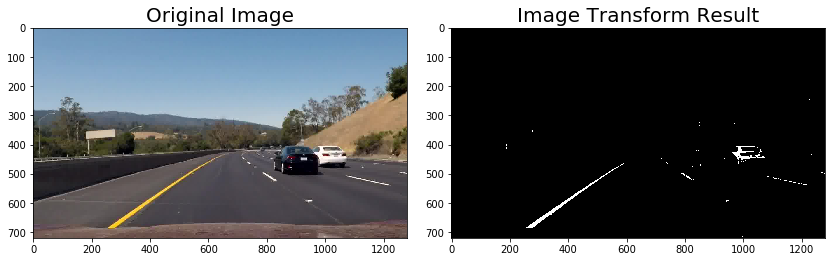

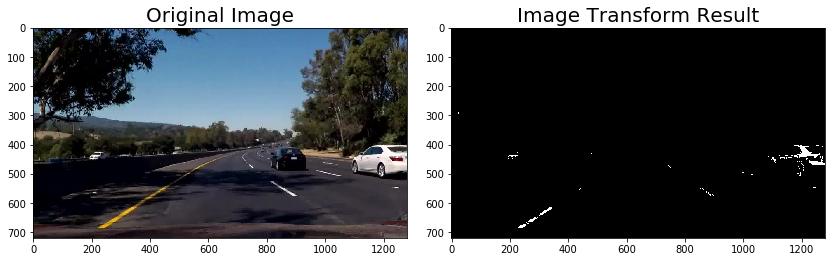

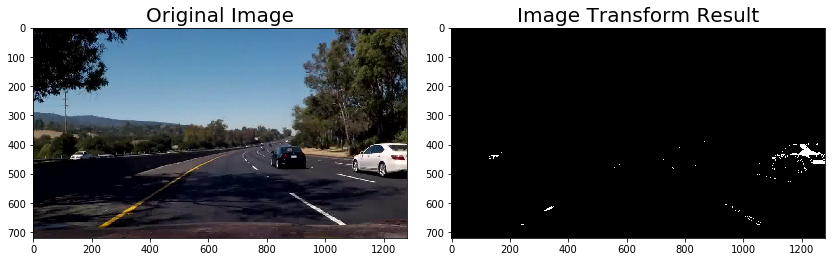

...

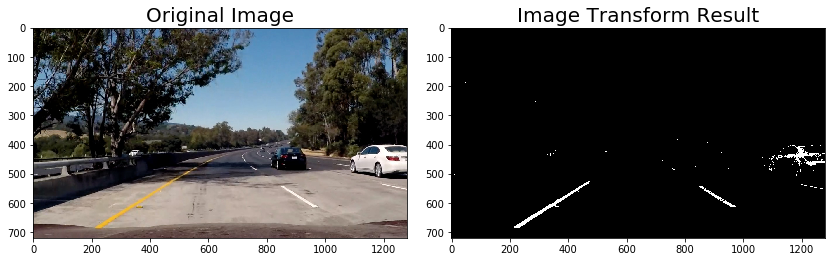

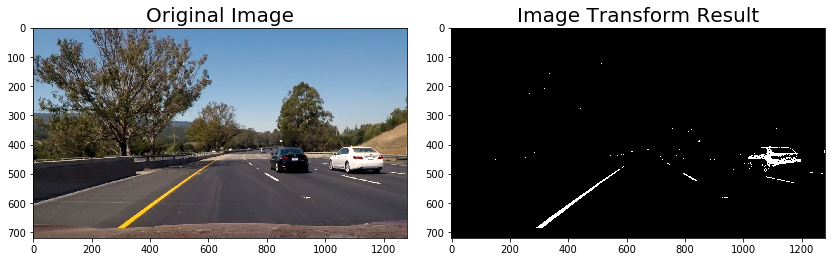

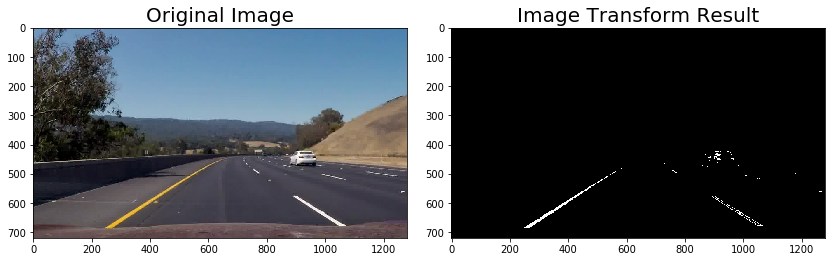

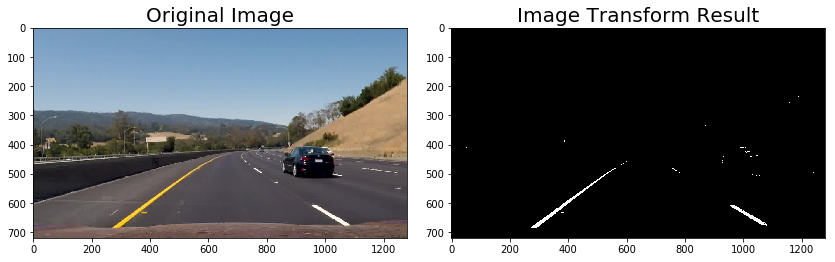

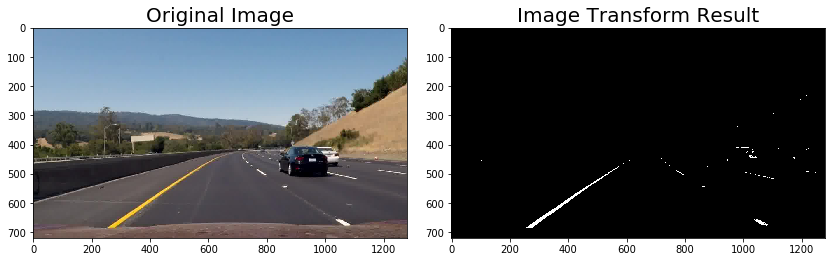

In [5]:
# Read all test images
images = glob.glob('test_images/test*.jpg')

# Step through the list
for idx, img in enumerate(images):
    image = mpimg.imread(img)
    result = image_transform(image, s_thresh=(140, 255), r_thresh=(200, 255), sx_thresh=(20, 150), mag_thresh=(30, 150))
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(result,cmap='gray')
    ax2.set_title('Image Transform Result', fontsize=20)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Perspective Transform

#### Calculate perspective matrix

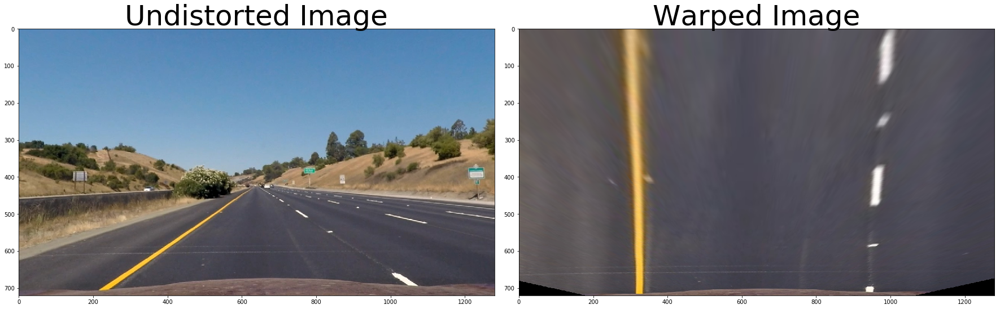

In [6]:
def perspective_transform(img):
    # Choose offset from image corners to plot detected corners
    # This should be chosen to present the result at the proper aspect ratio
    offset = 100 # offset for dst points
    # For source points I'm grabbing the four corners of a trapezoid masking the lane lines ahead of the camera
    src = np.float32([[200, img_size[1]], [1130, img_size[1]], [695, 460], [585, 460]])
    # For destination points, I'm arbitrarily choosing some points to be
    # a nice fit for displaying our warped result 
    dst = np.float32([[320, img_size[1]], [960, img_size[1]], [960, 0], [320, 0]])
    # Given src and dst points, calculate the perspective and inverse perspective transform matrices
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(img, M, (img.shape[1], img.shape[0]))
        
    # Draw src and dst points on respective images
#    src = np.array([[200, img_size[1]], [1130, img_size[1]], [695, 460], [585, 460]], dtype=np.int32)
#    src = src.reshape((-1,1,2))
#    dst = np.array([[320, img_size[1]], [960, img_size[1]], [960, 0], [320, 0]], dtype=np.int32)
#    dst = dst.reshape((-1,1,2))
#    img = cv2.polylines(img, src, (255,0,0))
#    warped = cv2.polylines(warped, dst, (255,0,0))
    # Return the resulting image and matrix
    return warped, M, Minv, img

top_down, perspective_M, perspective_Minv, undist_poly = perspective_transform(undist_straight)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(undist_poly)
ax1.set_title('Undistorted Image', fontsize=50)
ax2.imshow(top_down)
ax2.set_title('Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#### Transform pipeline result

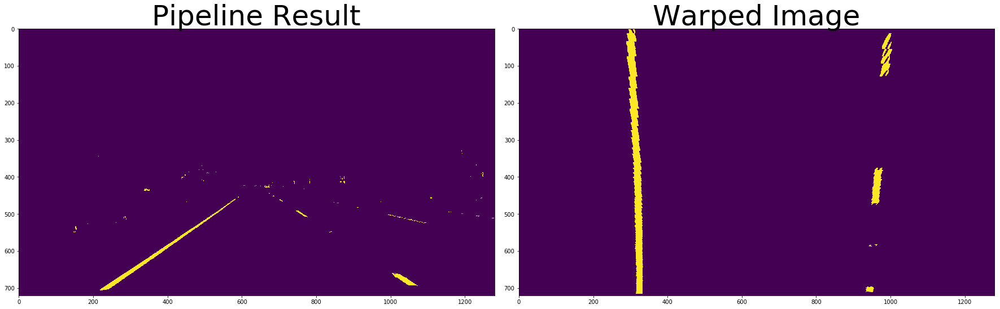

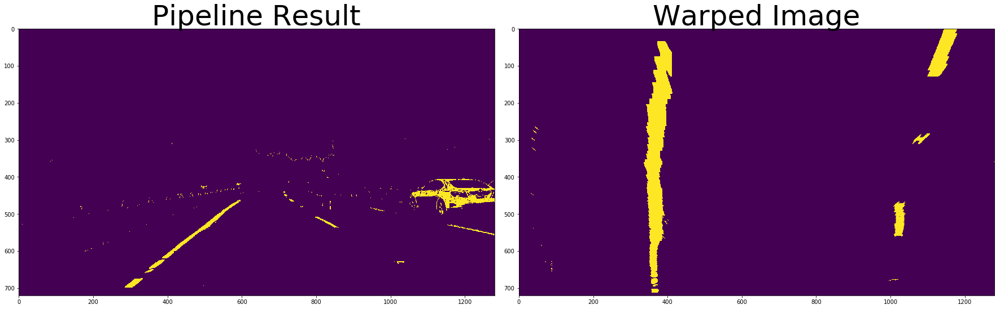

In [7]:
warped_straight = cv2.warpPerspective(result_straight, perspective_M, img_size, flags=cv2.INTER_LINEAR)
warped_curved = cv2.warpPerspective(result_curved, perspective_M, img_size, flags=cv2.INTER_LINEAR)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(result_straight)
ax1.set_title('Pipeline Result', fontsize=50)
ax2.imshow(warped_straight)
ax2.set_title('Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(result_curved)
ax1.set_title('Pipeline Result', fontsize=50)
ax2.imshow(warped_curved)
ax2.set_title('Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#### Transform test images

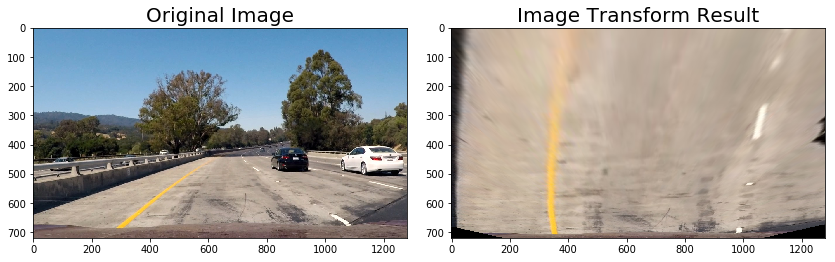

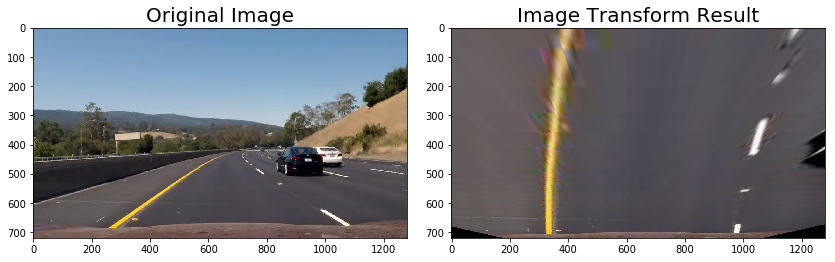

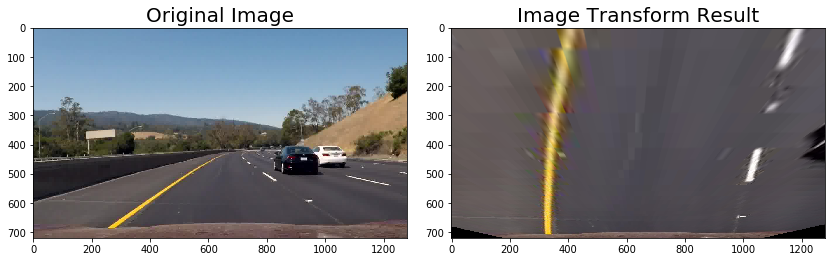

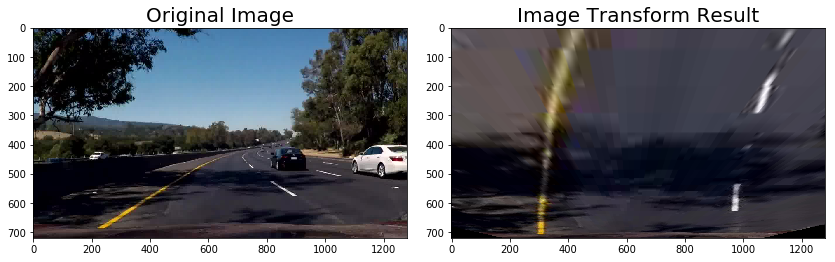

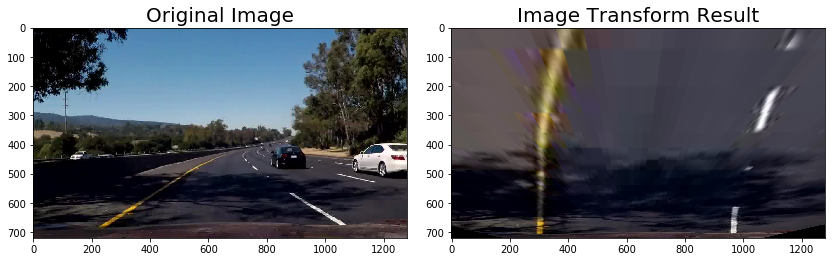

...

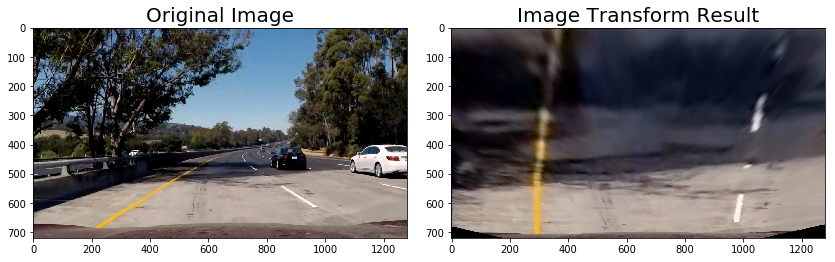

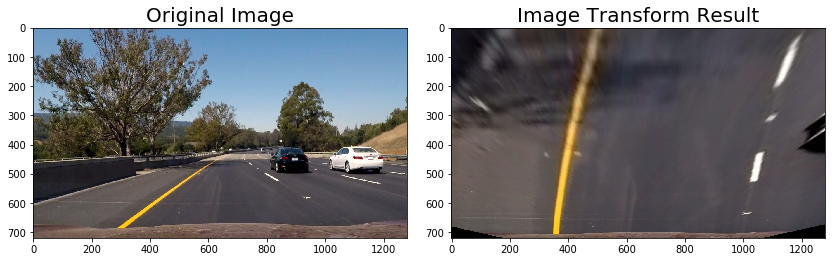

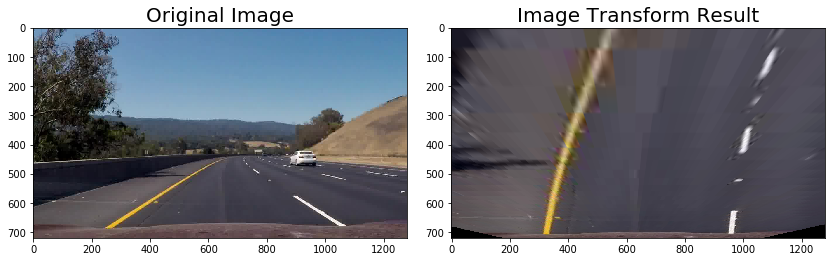

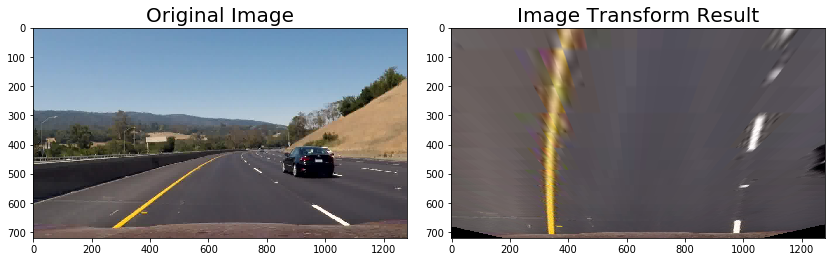

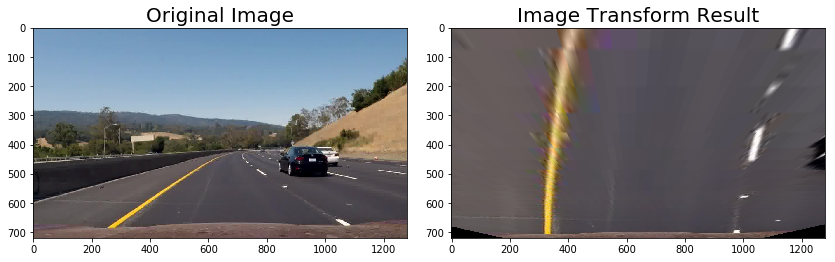

In [8]:
# Read all test images
images = glob.glob('test_images/test*.jpg')

# Step through the list
for idx, img in enumerate(images):
    image = mpimg.imread(img)
    result = cv2.warpPerspective(image, perspective_M, img_size, flags=cv2.INTER_LINEAR)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(result,cmap='gray')
    ax2.set_title('Warped Image', fontsize=20)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Finding Lane Lines

#### Implement sliding window and polynomial fit

In [9]:
def find_lanes(warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(warped[warped.shape[0]/2:,:], axis=0)
    # Create an output image to draw on and  visualize the warped
    out_img = np.dstack((warped, warped, warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = warped.shape[0] - (window+1)*window_height
        win_y_high = warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    return left_fit, right_fit, nonzerox, nonzeroy, left_lane_inds, right_lane_inds, leftx, rightx, out_img

#### Visualization

C:\Miniconda3\envs\carnd-term1\lib\site-packages\ipykernel\__main__.py:3: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  app.launch_new_instance()


(720, 0)

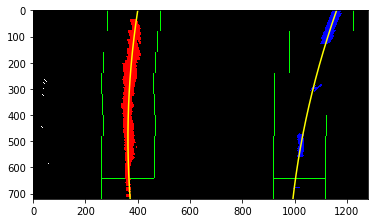

In [10]:
# Configure image source
warped = warped_curved # or warped_straight

left_fit, right_fit, nonzerox, nonzeroy, left_lane_inds, right_lane_inds, leftx, rightx, out_img = find_lanes(warped)

# Generate x and y values for plotting
ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

#### Recurring polynomial fit

In [11]:
# Assume you now have a new warped binary image 
# from the next frame of video (also called "warped")
# It's now much easier to find line pixels!
def find_lanes_again(img, left_fit, right_fit):
    nonzero = warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    return left_fit, right_fit, nonzerox, nonzeroy, left_lane_inds, right_lane_inds, leftx, rightx, out_img

#### Visualization

(720, 0)

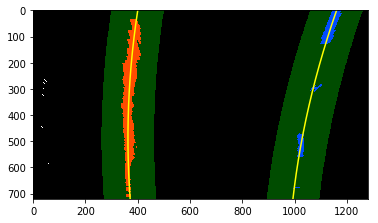

In [12]:
left_fit, right_fit, nonzerox, nonzeroy, left_lane_inds, right_lane_inds, leftx, rightx, out_img = find_lanes_again(warped, left_fit, right_fit)

# Generate x and y values for plotting
ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

# Create an image to draw on and an image to show the selection window
out_img = np.dstack((warped, warped, warped))*255
window_img = np.zeros_like(out_img)
# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
margin = 100
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

#### Calculate radii of lane curvature
Curve radius calculation borrowed from: http://www.intmath.com/applications-differentiation/8-radius-curvature.php

In [13]:
y_eval = np.max(ploty)

# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

# Fit new polynomials to x,y in world space
left_fit_cr = left_fitx*xm_per_pix
right_fit_cr = right_fitx*xm_per_pix
# Calculate the radii of curvature in meters
left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])

print(left_curverad, 'm', right_curverad, 'm')

505433.290475 m 4250666.48419 m


## Drawing back on original image

#### Calculate Image Information

In [14]:
def find_3p_circle_radius(x1,y1,x2,y2,x3,y3):
    m1 = (y2-y1)/(x2-x1)
    m2 = (y3-y2)/(x3-x2)
    xc = (m1*m2*(y1-y3)+m2*(x1+x2)-m1*(x2+x3))/(2*(m2-m1))
    yc = -(xc-(x1+x2)/2)/m1+(y1+y2)/2
    Radius = np.sqrt((x2-xc)*(x2-xc)+(y2-yc)*(y2-yc))
    
    return m1, m2, xc, yc, Radius

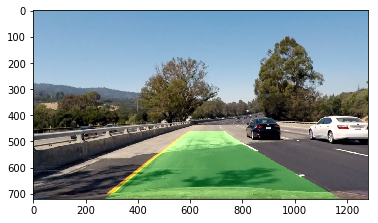

In [15]:
# Create an image to draw the lines on
warp_zero = np.zeros_like(warped).astype(np.uint8)
color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
undist = undist_curved # or undist_straight

# Recast the x and y points into usable format for cv2.fillPoly()
pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
pts = np.hstack((pts_left, pts_right))

# Draw the lane onto the warped blank image
cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

# Warp the blank back to original image space using inverse perspective matrix
newwarp = cv2.warpPerspective(color_warp, perspective_Minv, (undist.shape[1], undist.shape[0])) 
# Combine the result with the original image
result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
plt.imshow(result)

## Image Pipeline

In [16]:
# Full image pipeline defined
def pipeline(img):
    
    ## Calculate image size
    img_size = (img.shape[1], img.shape[0])
    
    ## Undistort image
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    ## Perform image transform operations
    transform = image_transform(undist, s_thresh=(140, 255), r_thresh=(200, 255), sx_thresh=(20, 150), mag_thresh=(30, 150))
    
    ## Get birds eye view of transformed image
    warped = cv2.warpPerspective(transform, perspective_M, img_size, flags=cv2.INTER_LINEAR)
    
    ## Find curve fit for lane lines
    left_fit, right_fit, nonzerox, nonzeroy, left_lane_inds, right_lane_inds, leftx, rightx, out_img = find_lanes(warped)
    #if first_pass == True:
    #    left_fit, right_fit, nonzerox, nonzeroy, left_lane_inds, right_lane_inds, out_img = find_lanes(warped)
    #    first_pass == False
    #else:
    #    left_fit, right_fit, nonzerox, nonzeroy, left_lane_inds, right_lane_inds, out_img = find_lanes(warped, left_fit, right_fit)
    ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    ## Calculate radii of curvatures
    y_eval = np.max(ploty)
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    # Fit new polynomials to x,y in world space
    left_fit_cr = left_fitx*xm_per_pix
    right_fit_cr = right_fitx*xm_per_pix
    # Calculate the radii of curvature in meters
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    ## Calculate image information
    # Define y-value where we want radius of curvature
    # I'll choose 3 y-values(max, mean and min):
    y_eval1 = np.max(ploty)
    y_eval2 = np.mean(ploty)
    y_eval3 = np.min(ploty)
    left_fitx_1 = left_fit[0]*y_eval1**2 + left_fit[1]*ploty + left_fit[2]
    left_fitx_2 = left_fit[0]*y_eval2**2 + left_fit[1]*ploty + left_fit[2]
    left_fitx_3 = left_fit[0]*y_eval3**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx_1 = right_fit[0]*y_eval1**2 + right_fit[1]*ploty + right_fit[2]
    right_fitx_2 = right_fit[0]*y_eval2**2 + right_fit[1]*ploty + right_fit[2]
    right_fitx_3 = right_fit[0]*y_eval3**2 + right_fit[1]*ploty + right_fit[2]
    # Calculated the turning center point xc, yc and radius: 
    lm1, lm2, lxc, lyc, lradius = find_3p_circle_radius(left_fitx_1,y_eval1,left_fitx_2,y_eval2,left_fitx_3,y_eval3,)
    l_steering_angle = 5*360/lxc # assume xc <> 0, xc and radius value is very close, xc will show the direction as well
    rm1, rm2, rxc, ryc, rradius = find_3p_circle_radius(right_fitx_1,y_eval1,right_fitx_2,y_eval2,right_fitx_3,y_eval3,)
    r_steering_angle = 5*360/rxc # assume xc <> 0, xc and radius value is very close, xc will show the direction as well
    steering_angle = l_steering_angle + r_steering_angle
    turning_radius = (lradius+rradius)/2 # smooth out the radius
    # Find camera position
    left_mean = np.mean(leftx)
    right_mean = np.mean(rightx)
    camera_pos = (warped.shape[1]/2)-np.mean([left_mean, right_mean])
    
    ## Plot curves on original image
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    ## Write onto the warped blank image
    font = cv2.FONT_HERSHEY_SIMPLEX
    #cv2.putText(img,'Left curve' + ' ' + str(left_curverad)[:6] + 'm',(10,60), font, 1,(255,255,255),1)
    cv2.putText(undist,'Camera Position' + ' [' + str(camera_pos*xm_per_pix)[:6] + '] m',(10,30), font, 1,(255,255,255),2)
    cv2.putText(undist,'Turning Radius ' +str(turning_radius)[:6] + '] m' ,(10,60), font, 1,(255,255,255),2)
    #cv2.putText(img, 'Turning Radius = %.2f m' % np.array(turning_radius), (10, 40), font, 1, (255, 255, 255), 2, cv2.LINE_AA)
    cv2.putText(undist,'Steering Angle '+'{:.6}'.format(str(steering_angle)) + '] deg',(10,90), font, 1,(255,255,255),2)
    
    ## Unwarp image
    # Warp the blank back to original image space using inverse perspective matrix
    newwarp = cv2.warpPerspective(color_warp, perspective_Minv, (undist.shape[1], undist.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    return result

#### Visualization

C:\Miniconda3\envs\carnd-term1\lib\site-packages\ipykernel\__main__.py:3: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  app.launch_new_instance()


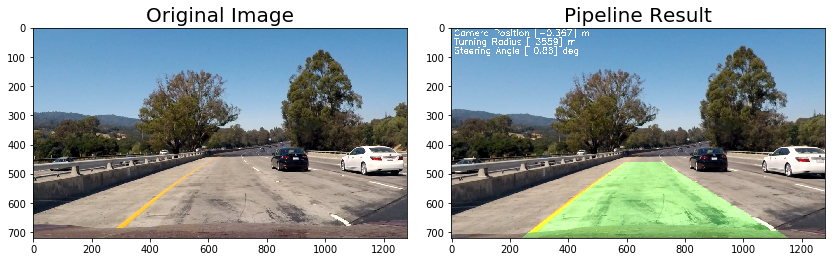

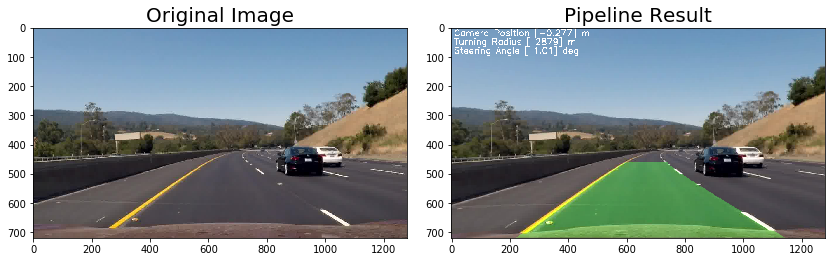

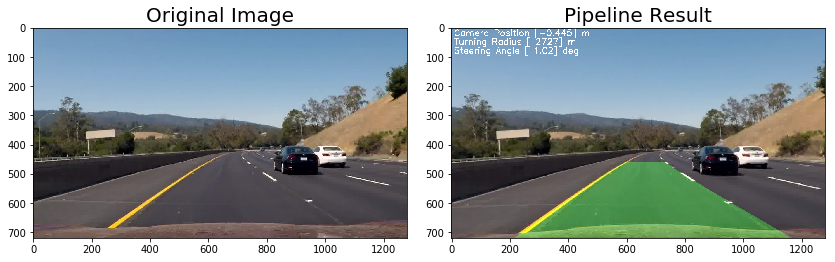

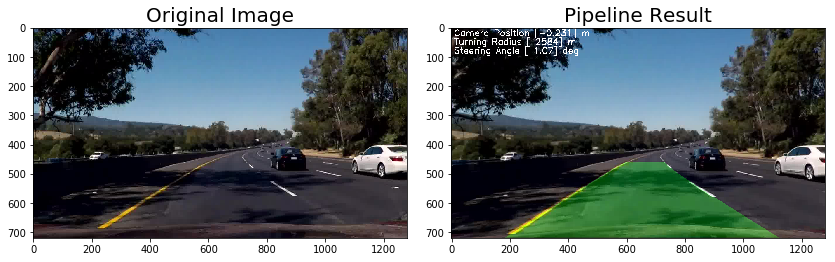

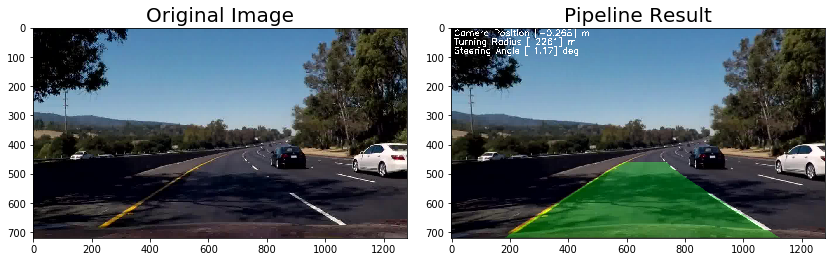

...

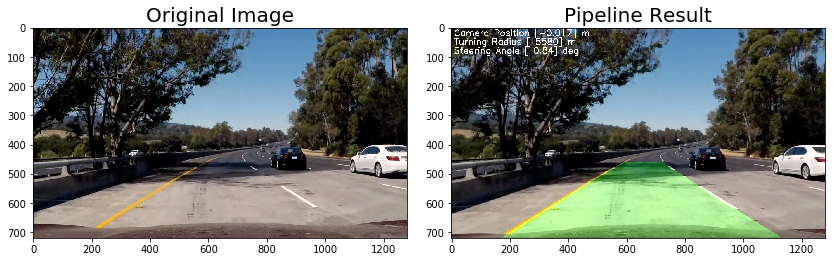

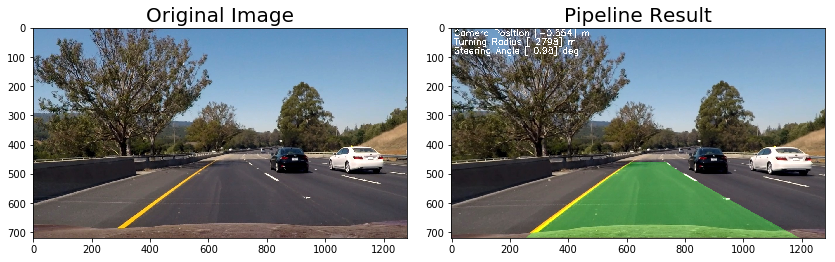

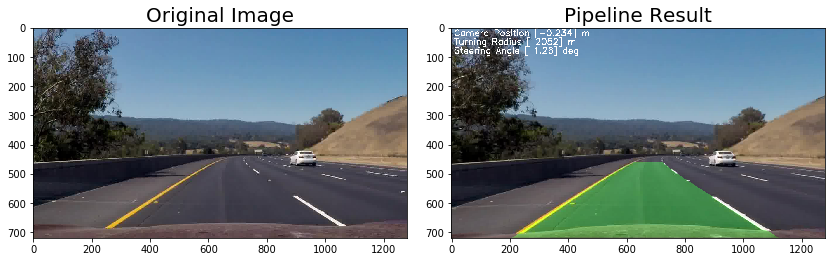

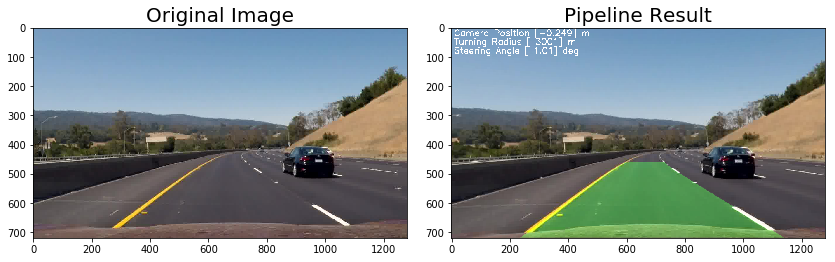

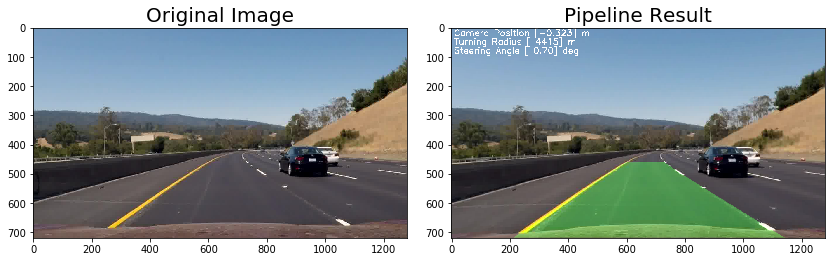

In [17]:
# Read all test images
images = glob.glob('test_images/test*.jpg')

#first_pass = True

# Step through the list
for idx, img in enumerate(images):
    image = mpimg.imread(img)
    result = pipeline(image)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(result,cmap='gray')
    ax2.set_title('Pipeline Result', fontsize=20)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Video Processing

In [18]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

write_output = 'project_video_out.mp4'
clip1 = VideoFileClip("project_video.mp4")
#first_pass = True
write_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
%time write_clip.write_videofile(write_output, audio=False)

[MoviePy] >>>> Building video project_video_out.mp4
[MoviePy] Writing video project_video_out.mp4


100%|█████████████████████████████████████▉| 1260/1261 [05:44<00:00,  3.09it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out.mp4 

Wall time: 5min 45s
